Start loading raw data.
Finish loading raw data.
Start filtering low-quality cells and SNPs.


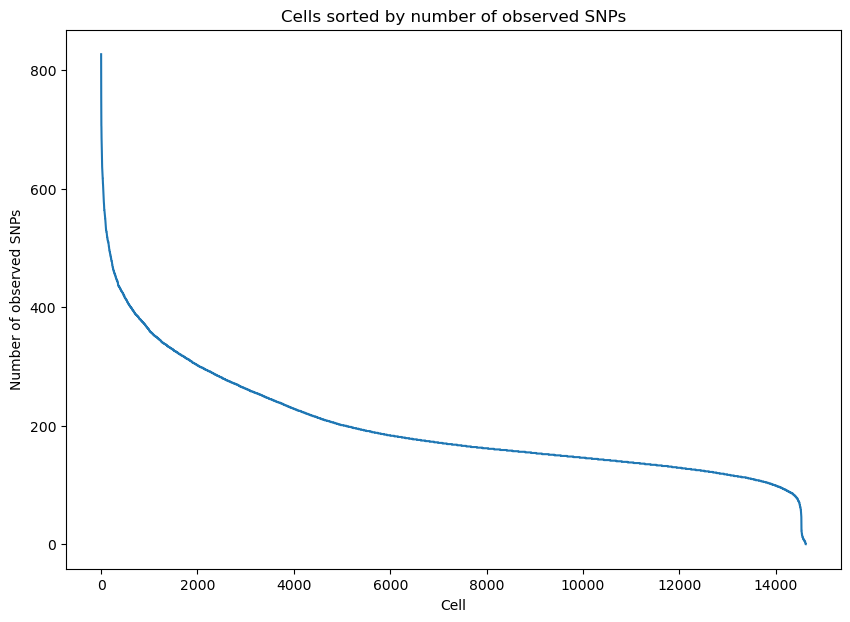

Please determine y-axis threshold in the plot to filter low-quality cells with low number of observed SNPs.   100


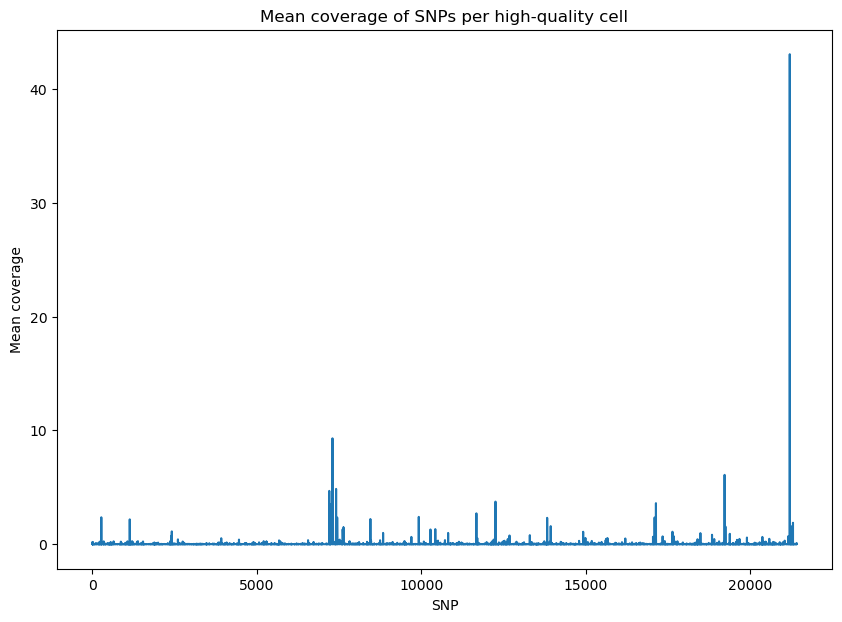

Please determine y-axis threshold in the plot to filter low-quality SNPs with low coverage.   0


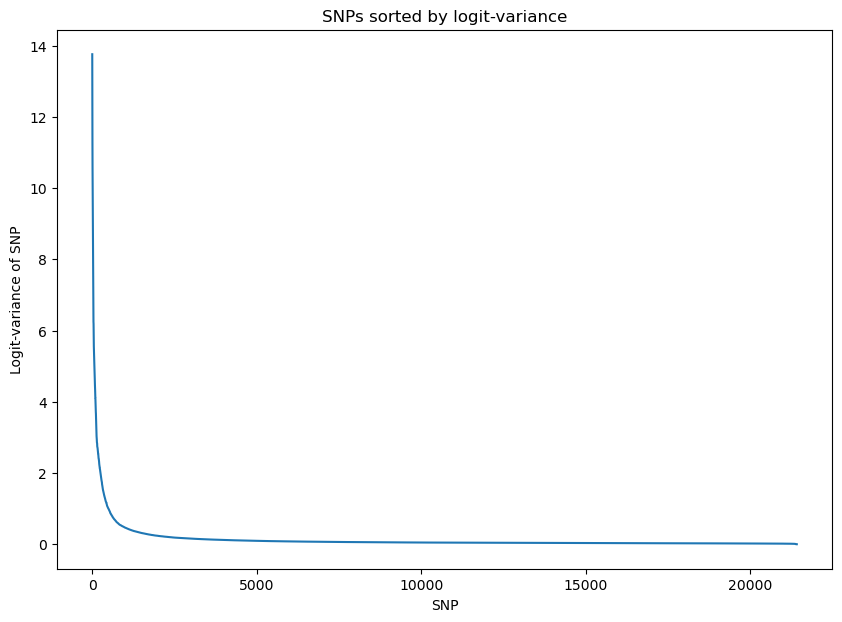

Please determine y-axis threshold in the plot to filter low-quality SNPs with low logit-variance.   0.5
Finish filtering low-quality data, 13939 cells and 929 SNPs will be used for downstream analysis.
Start training VAE.
Epoch[10/2000], Cost: 1.152597
Epoch[20/2000], Cost: 0.900115
Epoch[30/2000], Cost: 0.780547
Epoch[40/2000], Cost: 0.713817
Epoch[50/2000], Cost: 0.669694
Epoch[60/2000], Cost: 0.636813
Epoch[70/2000], Cost: 0.610663
Epoch[80/2000], Cost: 0.588832
Epoch[90/2000], Cost: 0.570072
Epoch[100/2000], Cost: 0.554117
Epoch[110/2000], Cost: 0.539539
Epoch[120/2000], Cost: 0.526704
Epoch[130/2000], Cost: 0.515204
Epoch[140/2000], Cost: 0.504793
Epoch[150/2000], Cost: 0.495355
Epoch[160/2000], Cost: 0.486877
Epoch[170/2000], Cost: 0.479077
Epoch[180/2000], Cost: 0.472054
Epoch[190/2000], Cost: 0.465526
Epoch[200/2000], Cost: 0.459645
Epoch[210/2000], Cost: 0.454140
Epoch[220/2000], Cost: 0.449011
Epoch[230/2000], Cost: 0.444408
Epoch[240/2000], Cost: 0.440073
Epoch[250/2000], Co

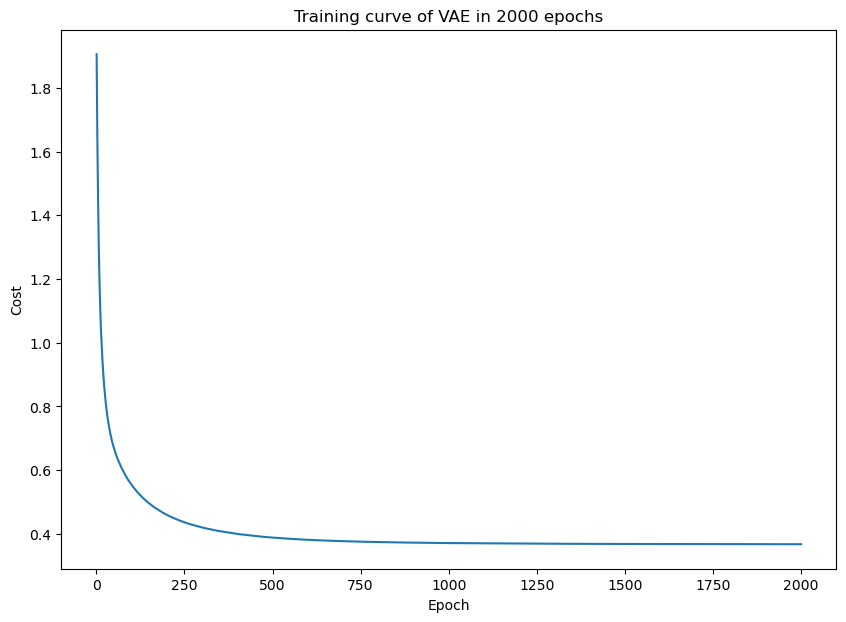

Start learning PCA and UMAP of latent space in VAE.
Finish learning, PCA and UMAP of latent space will be shown below.


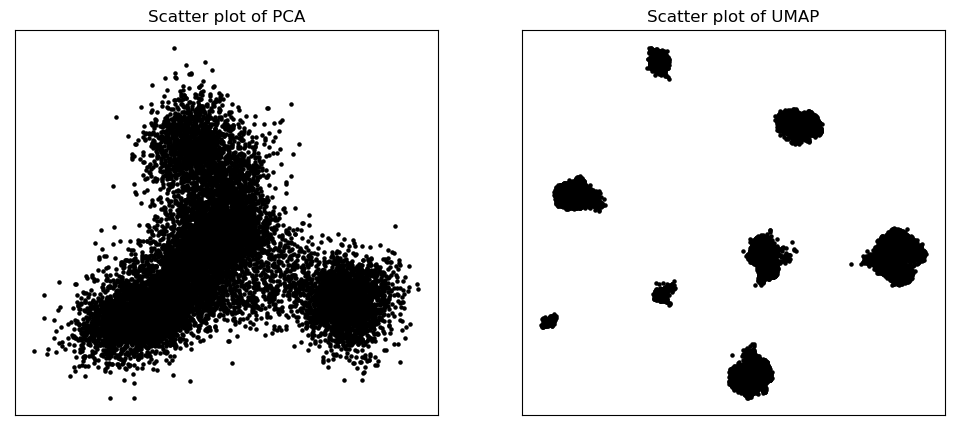

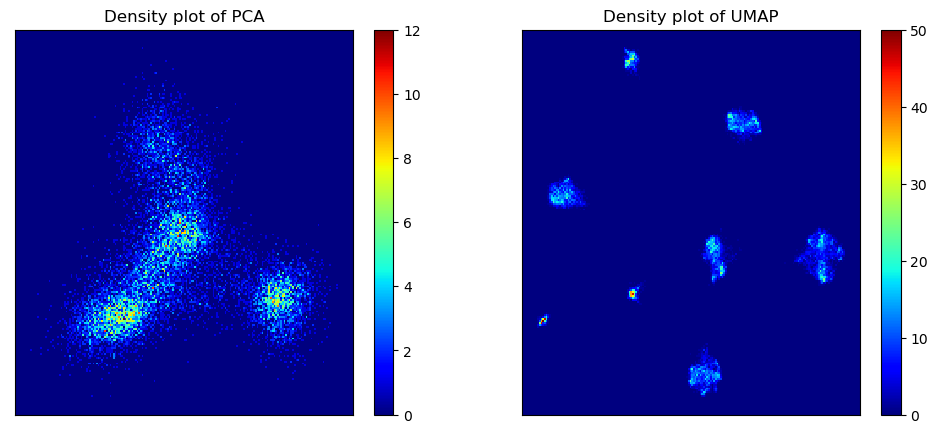

Start clustering.
2 clusters, Distortion: 308607.562500
3 clusters, Distortion: 206338.156250
4 clusters, Distortion: 136354.687500
5 clusters, Distortion: 75858.968750
6 clusters, Distortion: 36756.484375
7 clusters, Distortion: 11535.562500
8 clusters, Distortion: 5476.198242
9 clusters, Distortion: 5132.285156
10 clusters, Distortion: 4808.113281
11 clusters, Distortion: 3751.732178
12 clusters, Distortion: 3565.760742
13 clusters, Distortion: 3310.430908
14 clusters, Distortion: 3403.424561
15 clusters, Distortion: 2627.995117
Finish clustering, PCA, UMAP, distortion, silhouette score of K-means clustering will be shown below.


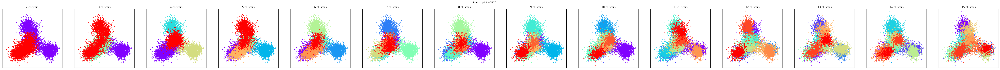

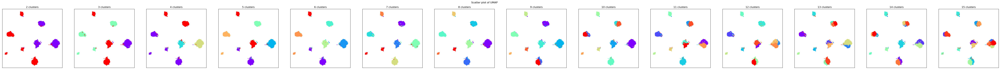

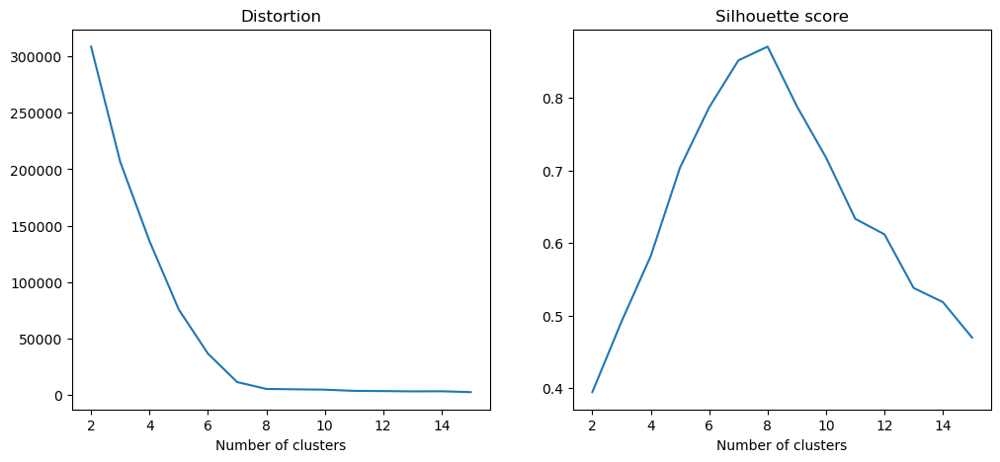

PCA and UMAP of individual clusters will be shown below.


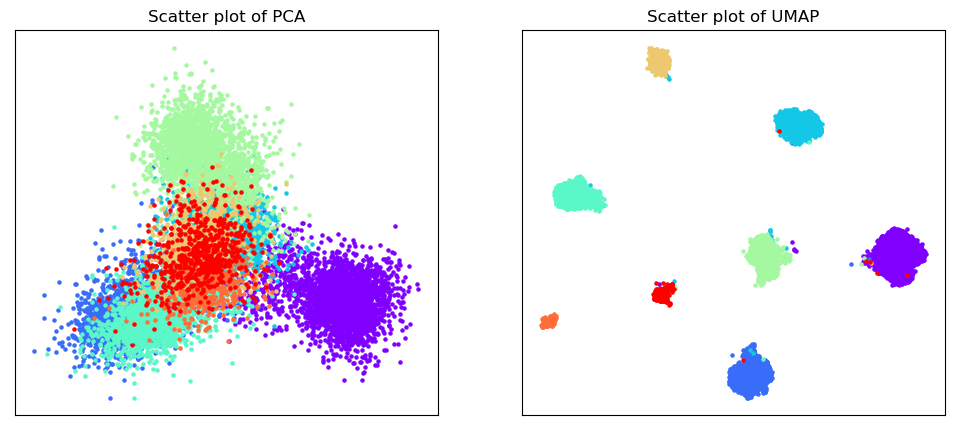

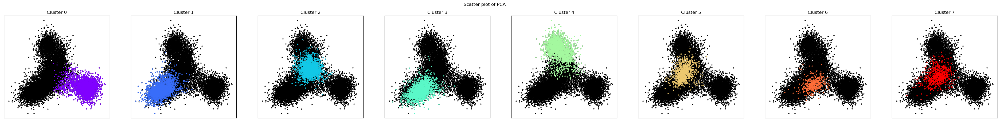

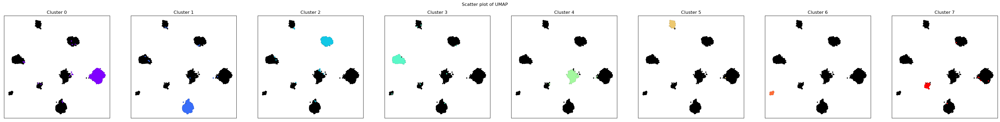

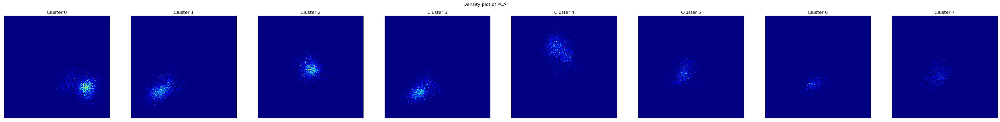

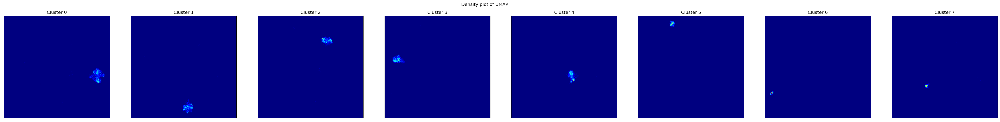

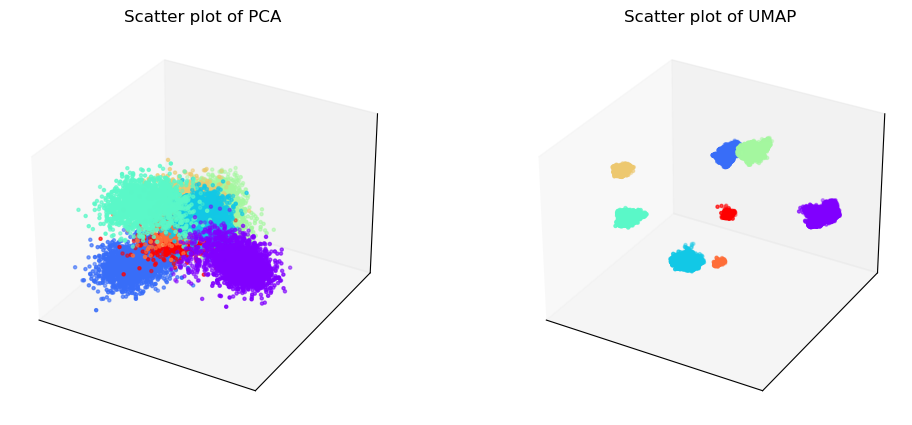

Phylogenetic tree in latent space will be shown below.


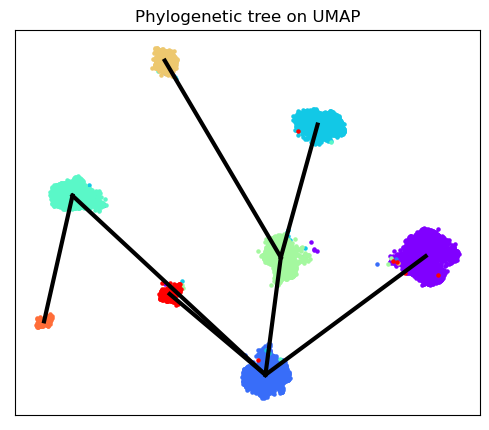

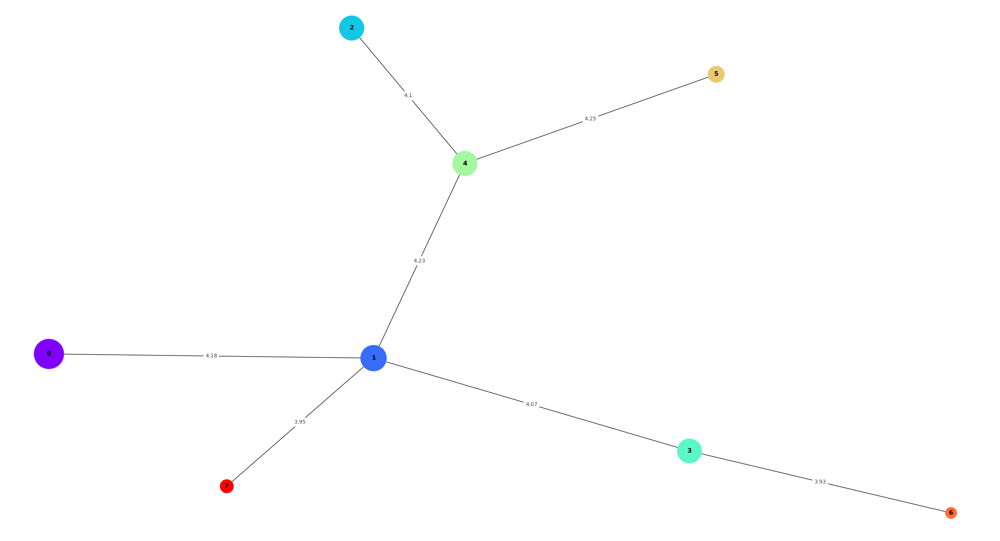

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:261: RuntimeWarning: divide by zero encountered in true_divide


SNP-allelic ratios of 13939 cells and 50 SNPs will be shown below.


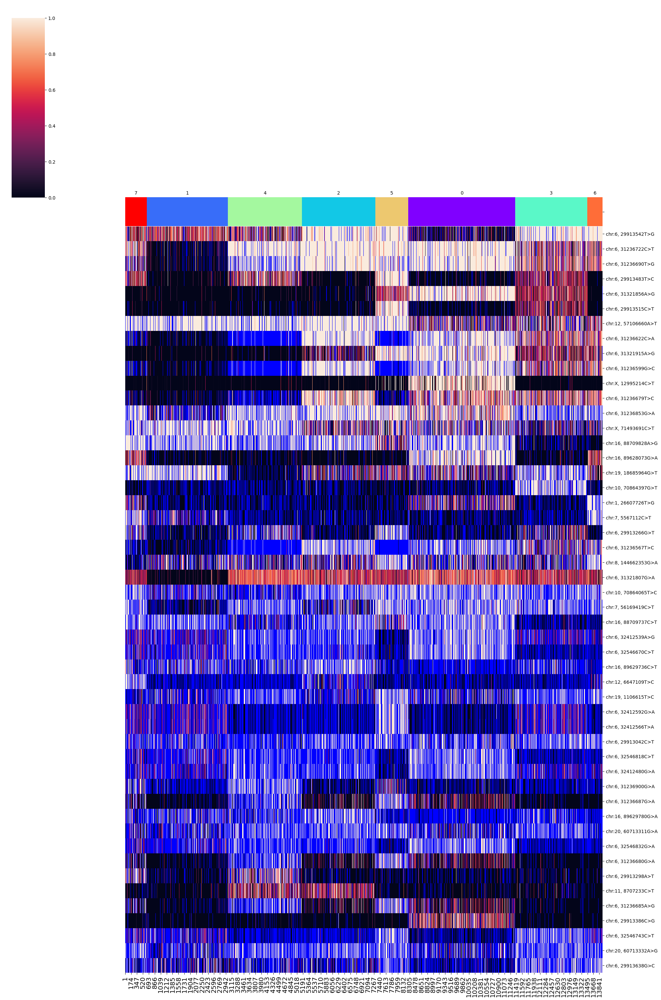

SNPs sorted by lowest p-value will be shown below


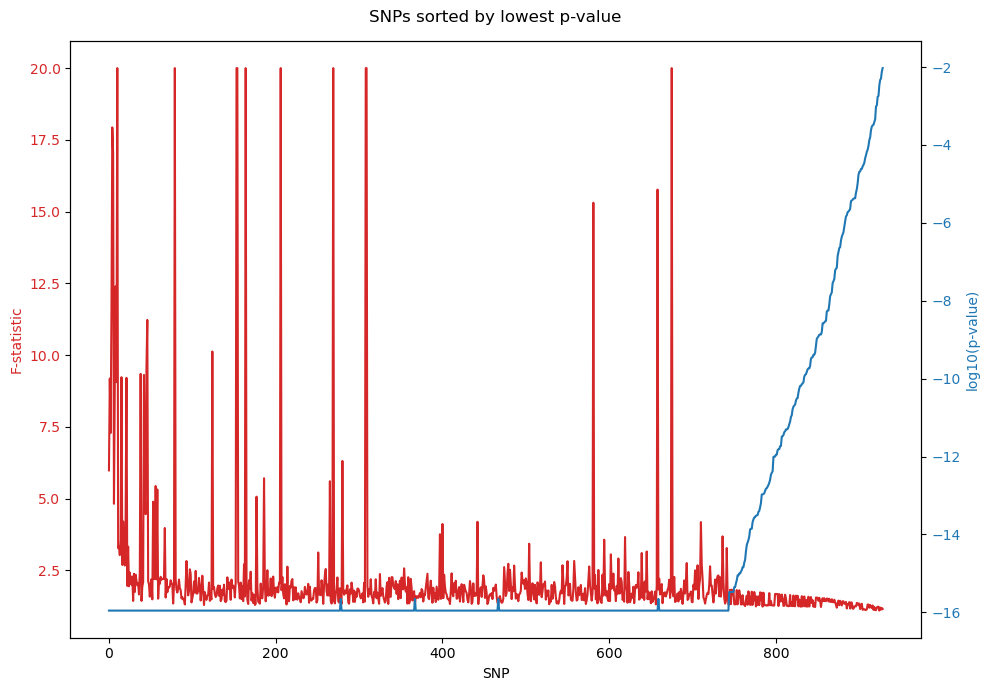

In [3]:
%run /home/u3570318/mount2/figures_final2/notebook2/SNPmanifold.ipynb

test1 = SNP_VAE(path = "/home/u3570318/mount2/figures_final2/data/demuxlet")
test1.filtering()
test1.training()
test1.clustering(algorithm = "kmeans_umap3d")
test1.phylogeny(cluster_no = 8)

Finish filtering low-quality data, 13939 cells and 929 SNPs will be used for downstream analysis.


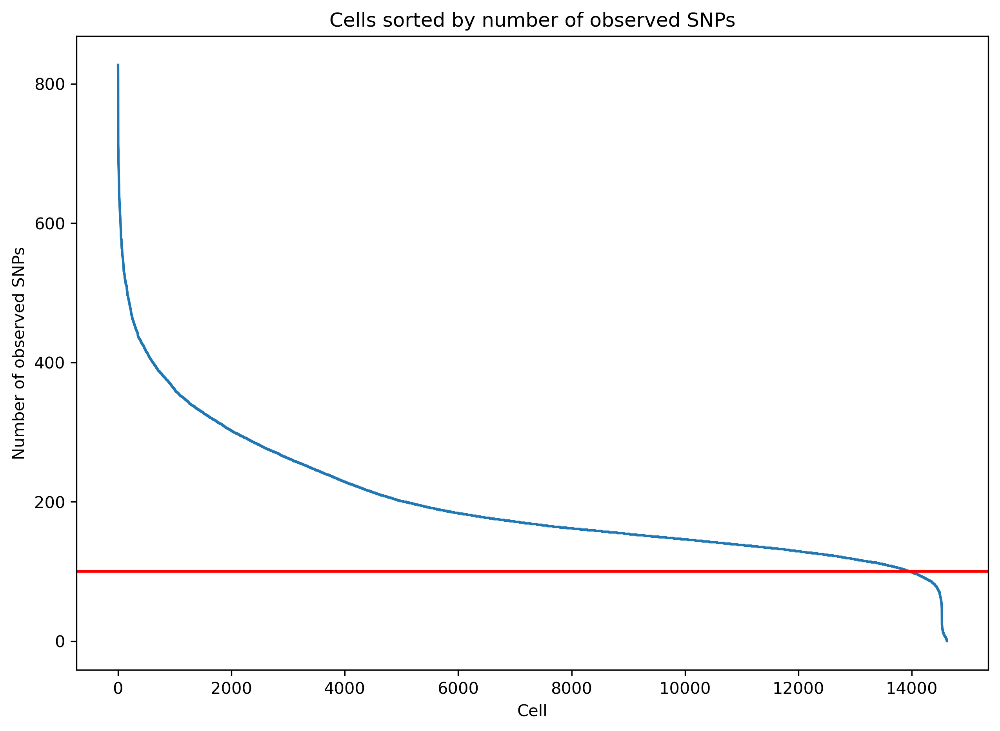

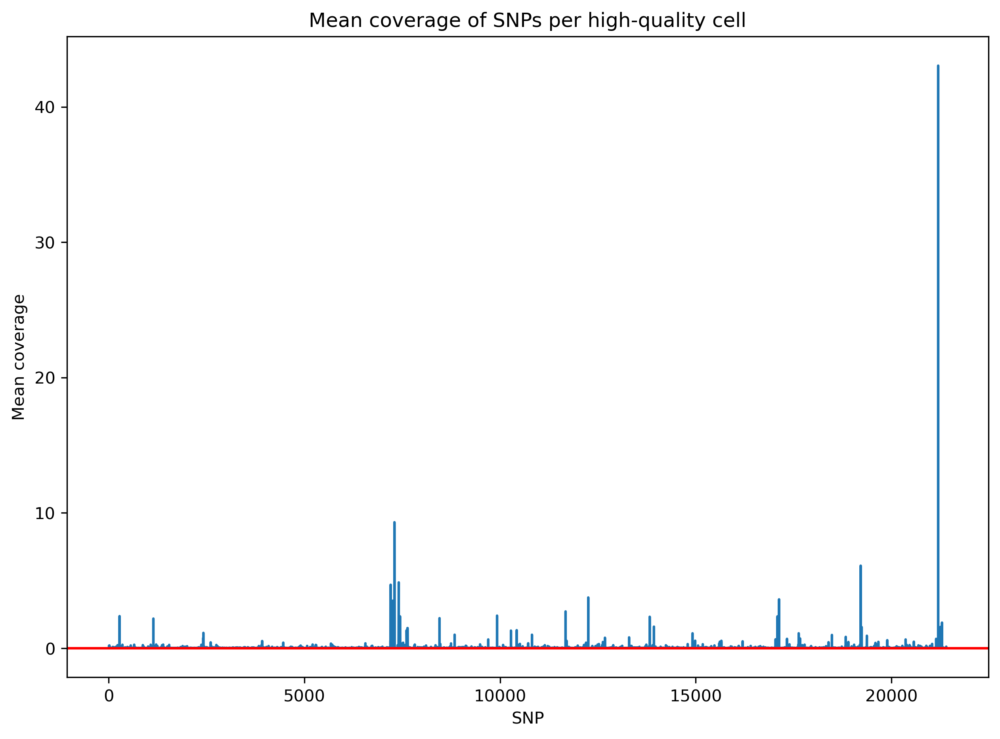

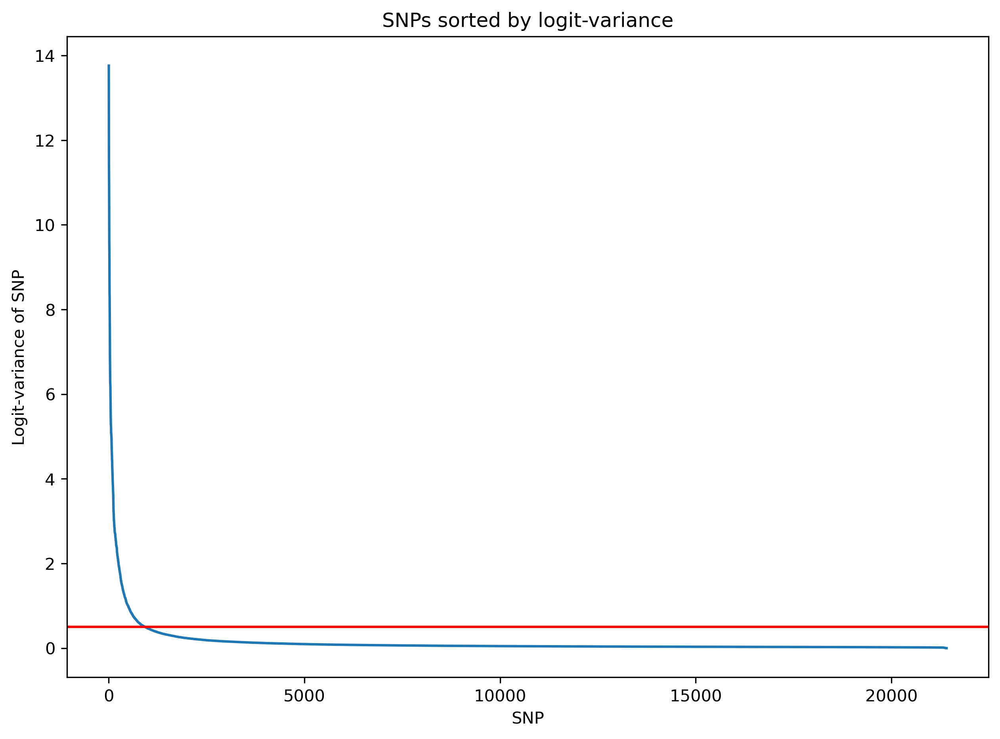

Training curve will be shown below.


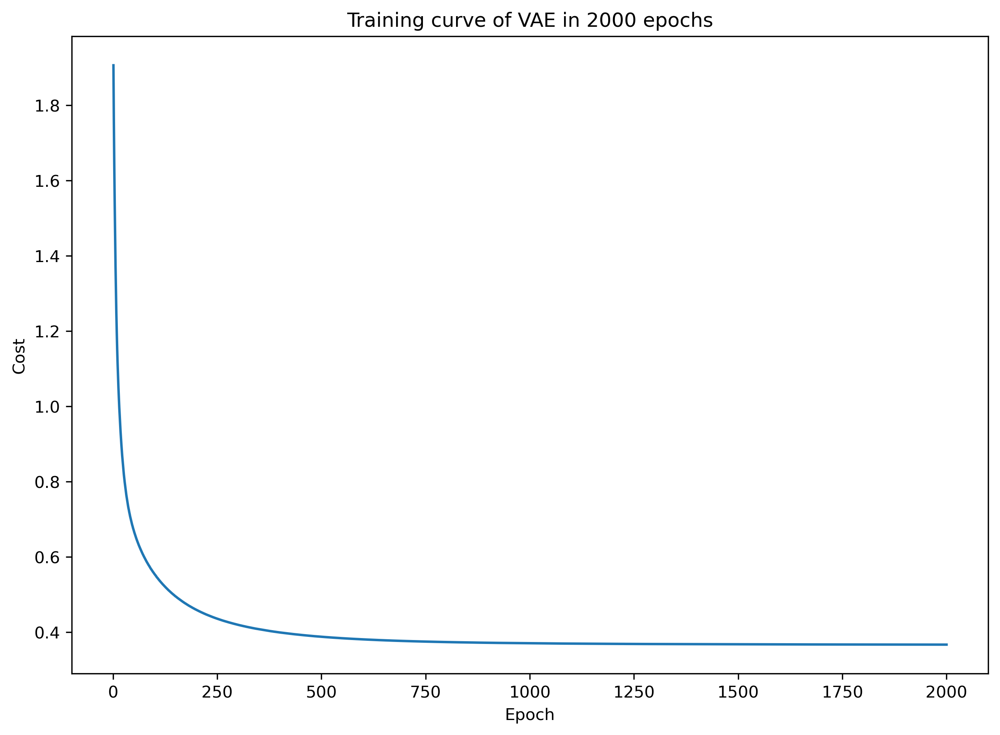

PCA and UMAP of latent space will be shown below.


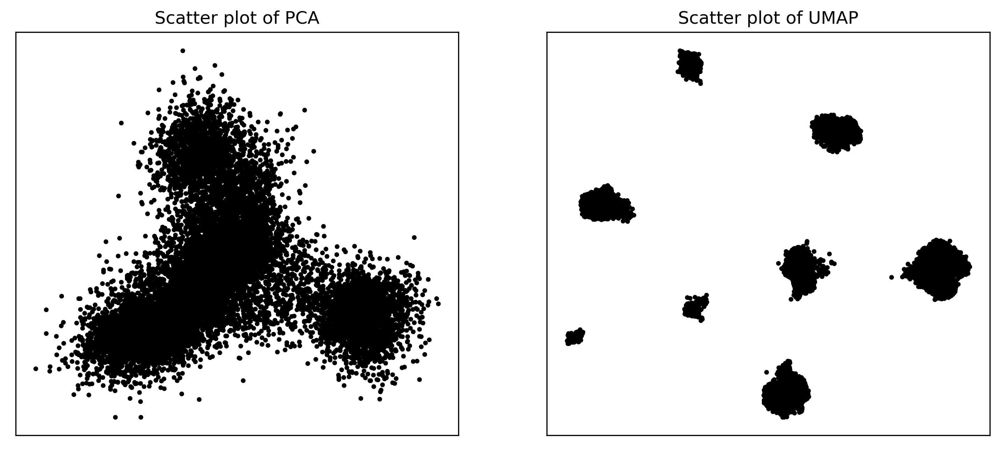

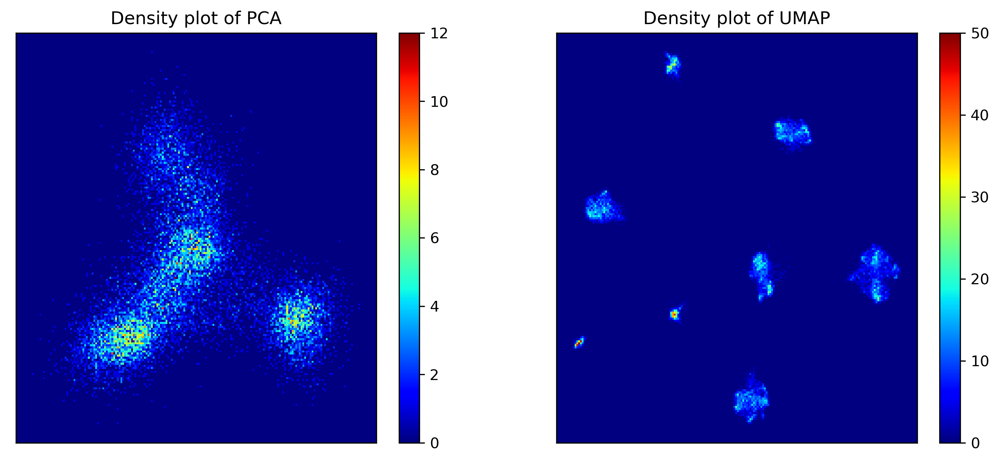

PCA, UMAP, distortion, silhouette score of K-means clustering will be shown below.


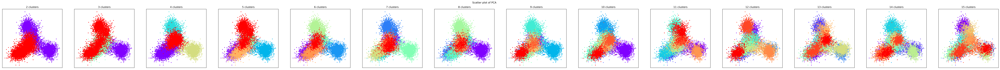

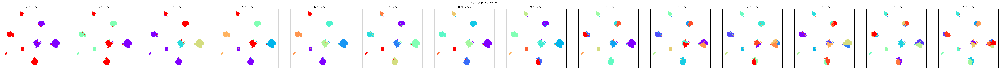

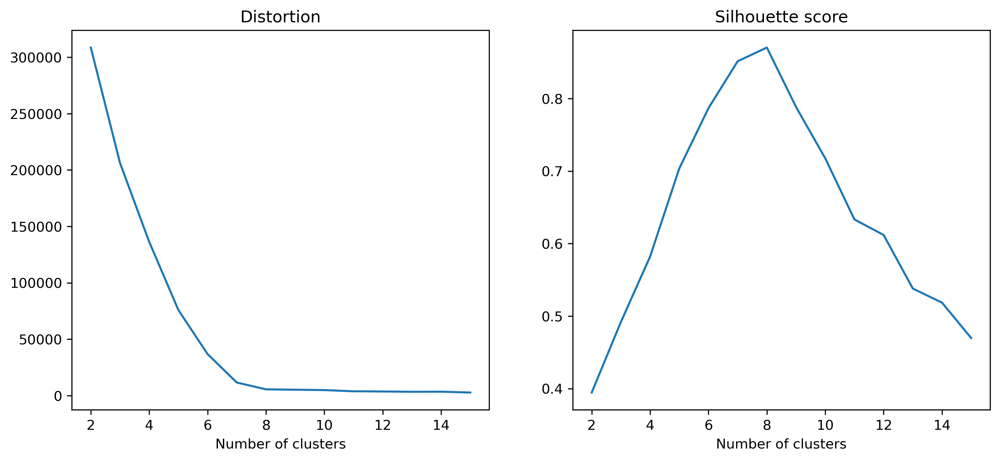

PCA and UMAP of individual clusters will be shown below.


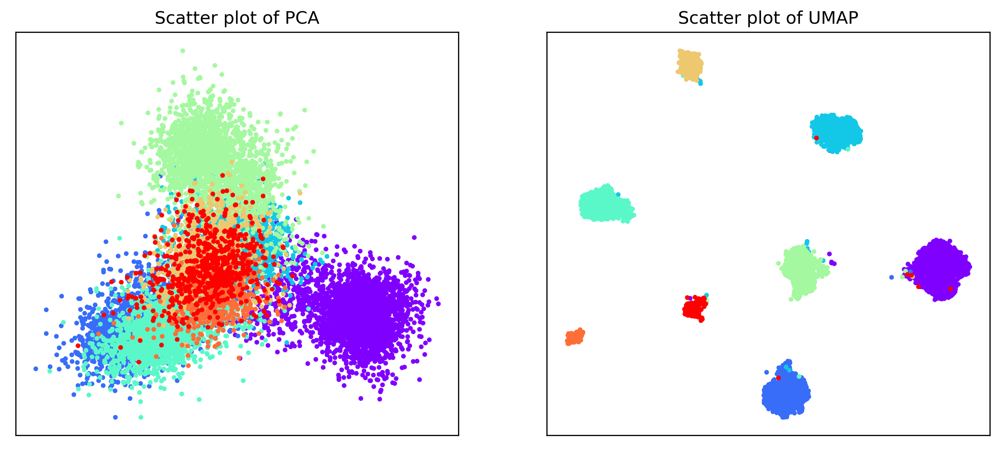

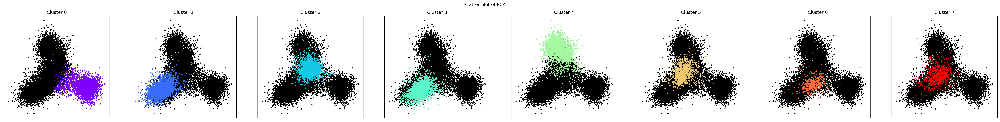

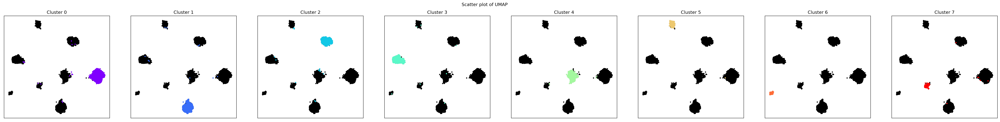

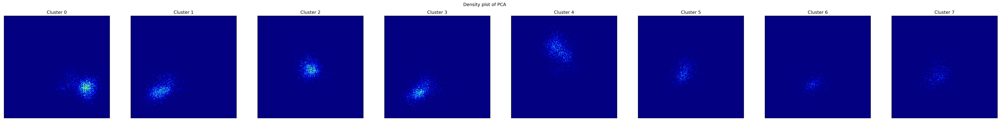

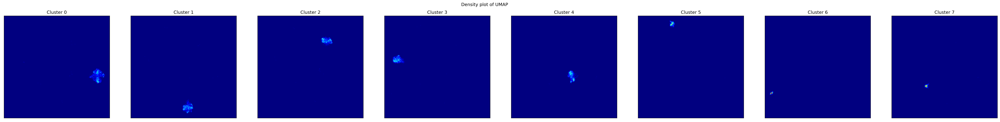

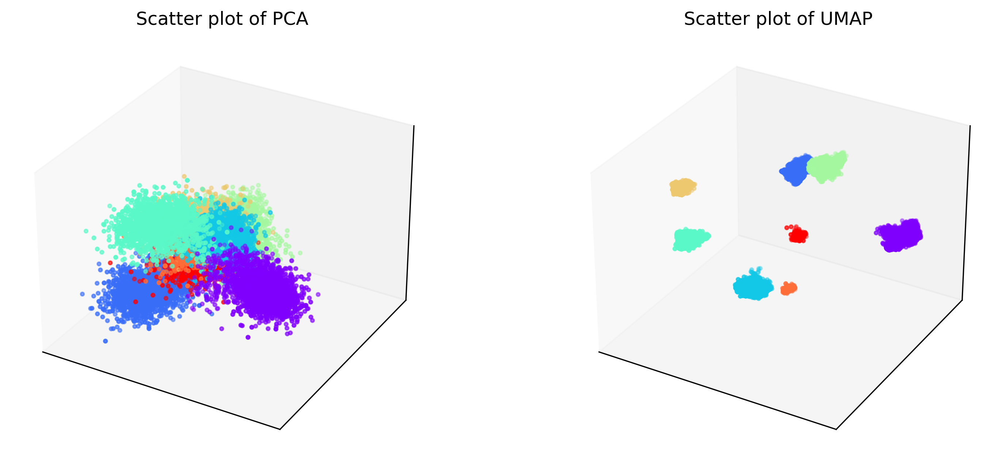

Phylogenetic tree in latent space will be shown below.


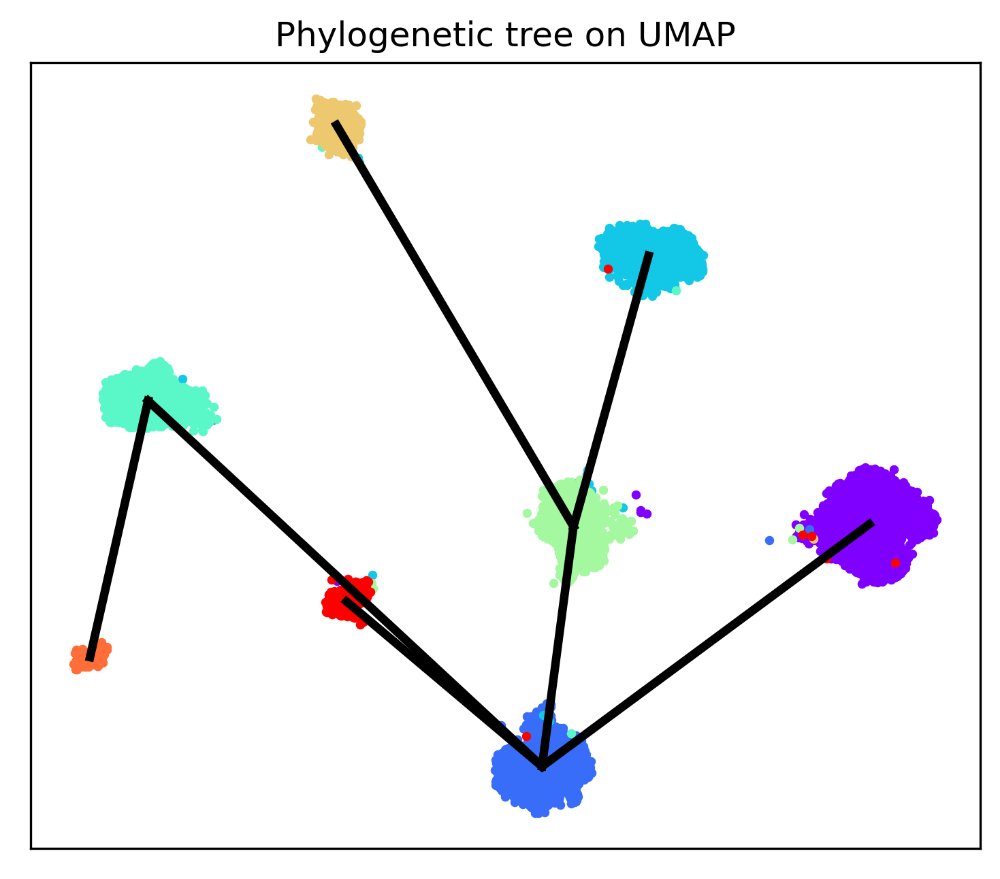

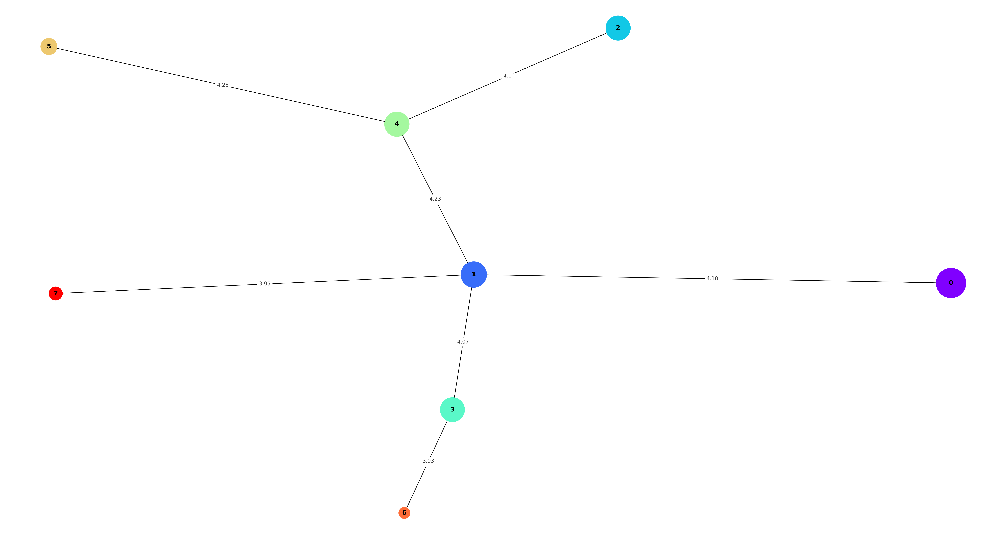

SNP-allelic ratios of 13939 cells and 25 SNPs will be shown below.


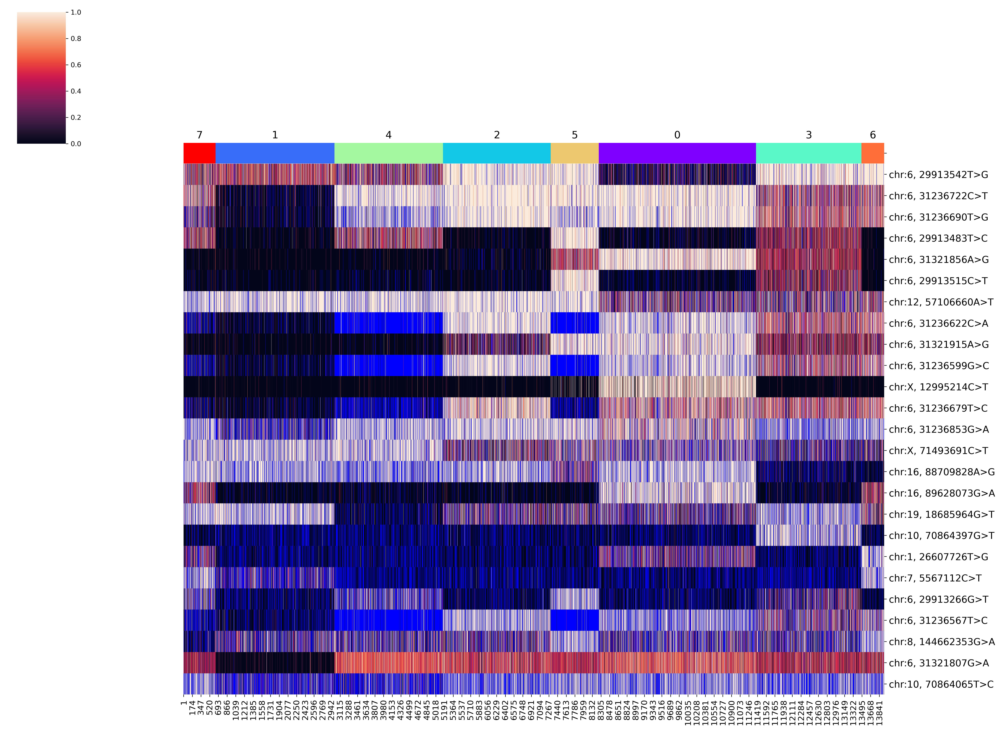

SNPs sorted by lowest p-value will be shown below


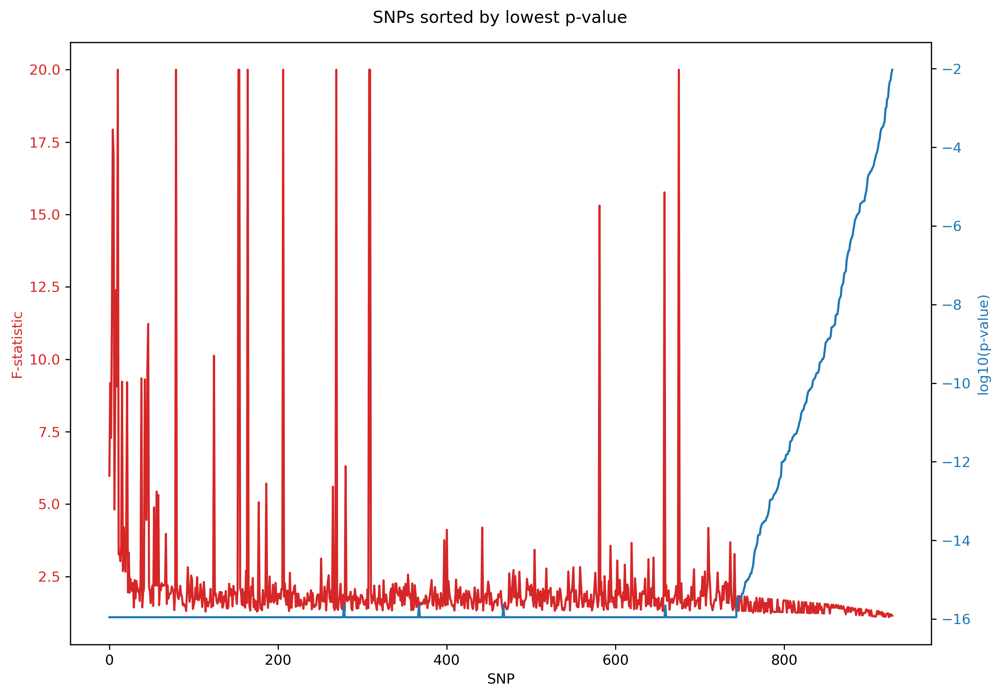

In [4]:
test1.filtering_summary(dpi = 300)
test1.training_summary(dpi = 300)
test1.clustering_summary(dpi = 300)
test1.phylogeny_summary(dpi = 300, SNP_no = 25, fontsize_y = 14, fontsize_x = 12, fontsize_c = 15)

Phylogenetic tree in latent space will be shown below.


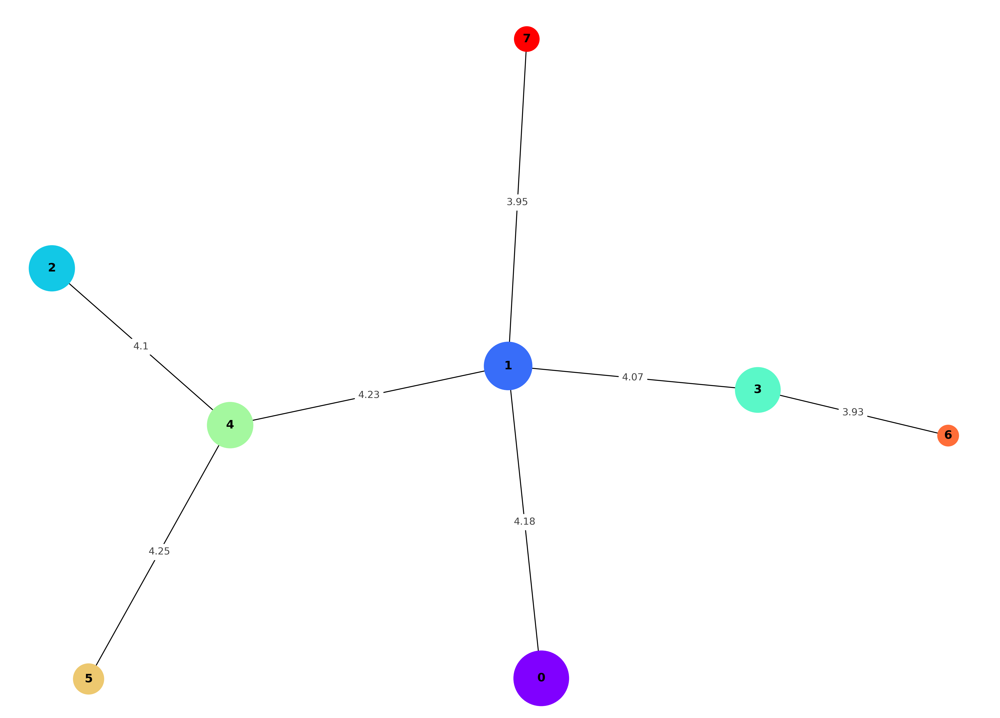

In [10]:
print(f"Phylogenetic tree in latent space will be shown below.")

graph = nx.Graph()

for u in range(len(test1.edge)):

    graph.add_edge(test1.edge[u][0], test1.edge[u][1], weight = test1.edge_weight[u], length = test1.edge_length_normalized[u])

pos = nx.spring_layout(graph, iterations = 3000, weight = 'weight')

plt.figure(figsize = (14, 10), dpi = 300) 
nx.draw(graph, pos, with_labels = True, font_weight = 'bold', node_size = test1.cluster_size[test1.connect_order], node_color = test1.colors[test1.connect_order])
nx.draw_networkx_edge_labels(graph, pos, nx.get_edge_attributes(graph, 'length'), rotate = False, alpha = 0.75)

plt.show()

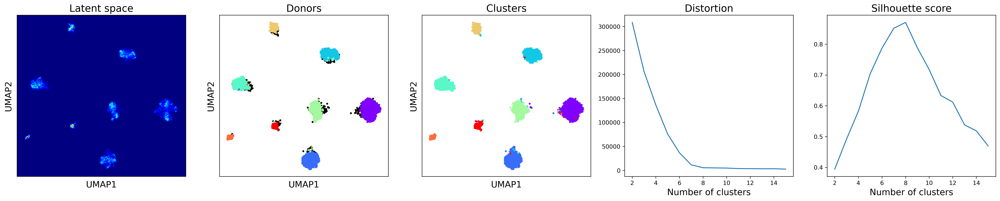

In [16]:
df = np.genfromtxt('/home/u3570318/mount2/figures_final2/data/demuxlet/id.csv', delimiter = ',')[test1.cell_filter]
doublet = np.genfromtxt('/home/u3570318/mount2/figures_final2/data/demuxlet/doublet.csv', delimiter = ',')[test1.cell_filter]
df[doublet == 1] = 8

donors = []

for h in range(9):
    
    donors.append(np.where(df == h)[0])

fig, axs = plt.subplots(1, 5, dpi = 300)
fig.set_size_inches(30, 5)

axs[1].set_title("Donors", fontsize = 17)

axs[1].scatter(test1.embedding_2d[donors[8], 0], test1.embedding_2d[donors[8], 1], s = 5, color = "black")

for w in range(8):
    
    axs[1].scatter(test1.embedding_2d[donors[w], 0], test1.embedding_2d[donors[w], 1], s = 5, color = test1.colors[[5, 7, 0, 3, 6, 2, 1, 4], :][w])
    
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[1].set_xlabel("UMAP1", fontsize = 15)
axs[1].set_ylabel("UMAP2", fontsize = 15)

xlim0 = axs[1].get_xlim()
ylim0 = axs[1].get_ylim()

axs[0].hist2d(test1.embedding_2d[:, 0], test1.embedding_2d[:, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([xlim0, ylim0]))
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[0].set_title("Latent space", fontsize = 17)
axs[0].set_xlabel("UMAP1", fontsize = 15)
axs[0].set_ylabel("UMAP2", fontsize = 15)

axs[2].set_title("Clusters", fontsize = 17)

for w in range(8):
    
    axs[2].scatter(test1.embedding_2d[test1.clusters[w], 0], test1.embedding_2d[test1.clusters[w], 1], s = 5, color = test1.colors[w])
    
axs[2].set_xticks([])
axs[2].set_yticks([])
axs[2].set_xlabel("UMAP1", fontsize = 15)
axs[2].set_ylabel("UMAP2", fontsize = 15)

axs[3].plot(np.arange(2, 16), test1.distortions)
axs[3].set_title("Distortion", fontsize = 17)
axs[3].set_xlabel("Number of clusters", fontsize = 15)    
axs[4].set_title("Silhouette score", fontsize = 17)
axs[4].set_xlabel("Number of clusters", fontsize = 15)
axs[4].plot(np.arange(2, 16), test1.scores)

plt.show()

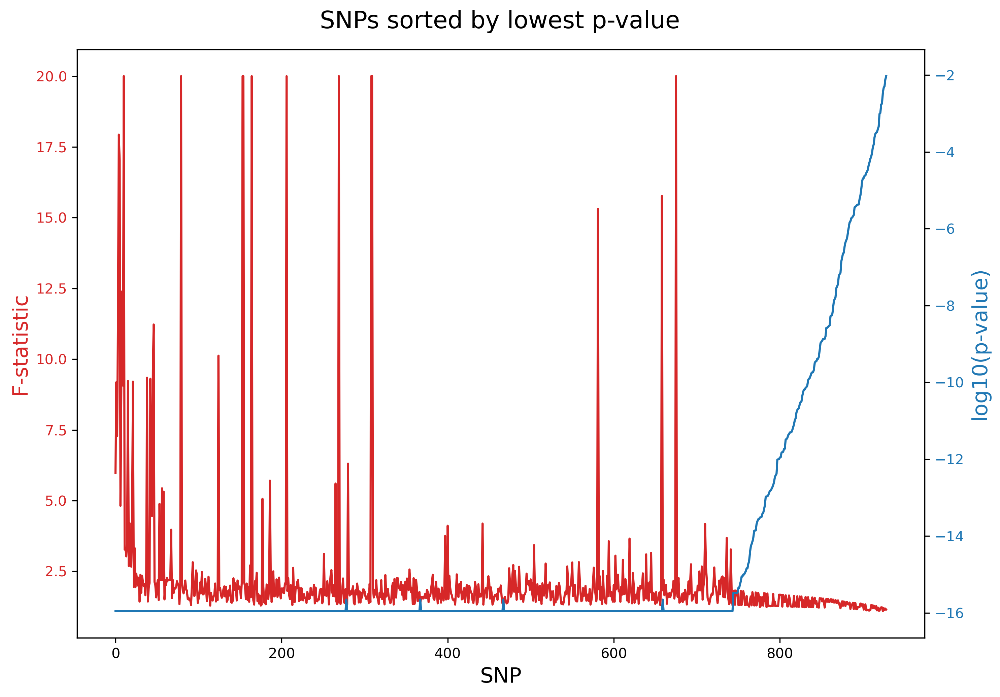

In [12]:
fig, ax1 = plt.subplots(dpi = 300)
fig.set_size_inches(10, 7)
fig.suptitle("SNPs sorted by lowest p-value", fontsize = 17)

ax1.set_xlabel('SNP', fontsize = 15)
ax1.set_ylabel('F-statistic', color = 'tab:red', fontsize = 15)
ax1.plot(np.arange(test1.SNP_total), test1.f_stat_ranked, color = 'tab:red')
ax1.tick_params(axis = 'y', labelcolor = 'tab:red')

ax2 = ax1.twinx()

color = 'tab:blue'
ax2.set_ylabel('log10(p-value)', color = 'tab:blue', fontsize = 15)
ax2.plot(np.arange(test1.SNP_total), np.log10(test1.p_value_ranked), color = 'tab:blue')
ax2.tick_params(axis = 'y', labelcolor = 'tab:blue')

fig.tight_layout()
plt.show()

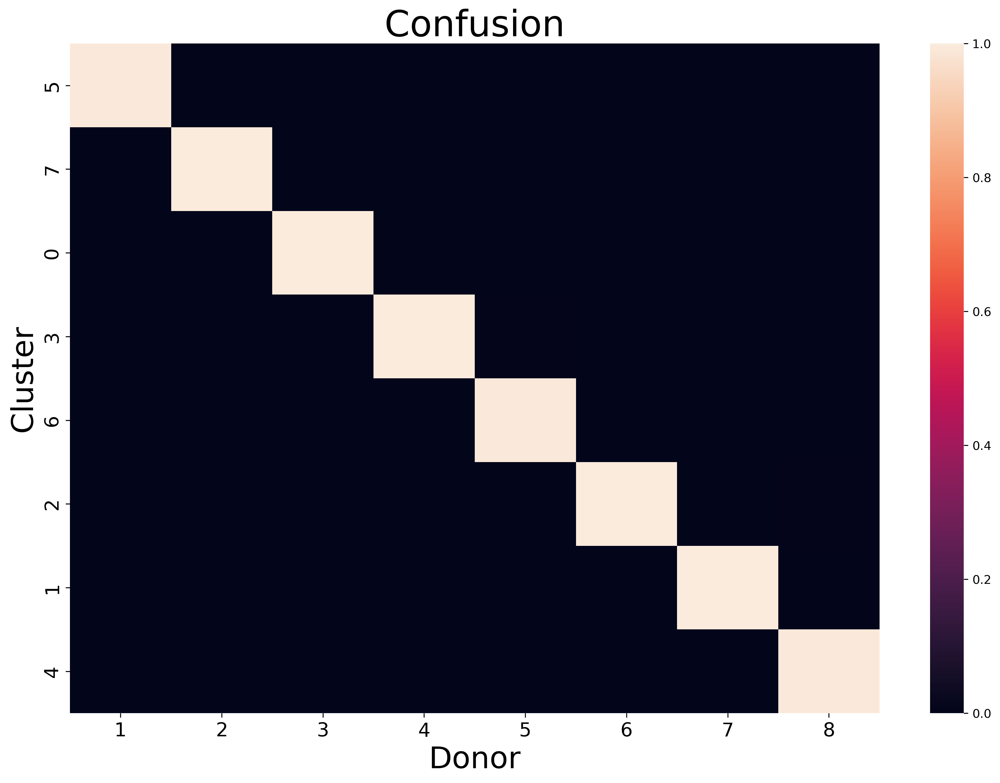

In [14]:
reference = df.astype(int)
predict = test1.assigned_label
    
matrix = np.zeros((8, 8))
ref_sum = np.zeros(8)

for q in range(sum(test1.cell_filter)):
    
    if reference[q] <= 7:

        matrix[reference[q], predict[q]] += 1
        ref_sum[reference[q]] += 1

prop = matrix / np.outer(ref_sum, np.ones(max(predict) + 1))

fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15, 10)
ax = sns.heatmap(prop.T[[5, 7, 0, 3, 6, 2, 1, 4], :], xticklabels = [1, 2, 3, 4, 5, 6, 7, 8], yticklabels = [5, 7, 0, 3, 6, 2, 1, 4])
ax.set_ylabel("Cluster", fontsize = 25)
ax.set_xlabel("Donor", fontsize = 25)
ax.set_title("Confusion", fontsize = 30)
plt.gcf().set_dpi(300)
ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize = 16)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize = 16)
plt.show()

In [15]:
np.mean(np.max(prop, 0))

0.9969553332307458

In [17]:
dffff = pd.read_csv("/home/u3570318/mount2/figures_final2/data/demuxlet/GSE96583_batch2.total.tsne.df.tsv", delimiter = "\t").iloc[0:14619][test1.cell_filter]
dffff

,tsne1,tsne2,ind,stim,cluster,cell,multiplets
AAACATACAATGCC-1,-4.277833,-19.294709,107,ctrl,5,CD4 T cells,doublet
AAACATACATTTCC-1,-27.640373,14.966629,1016,ctrl,9,CD14+ Monocytes,singlet
AAACATACCAGAAA-1,-27.493646,28.924885,1256,ctrl,9,CD14+ Monocytes,singlet
AAACATACCAGCTA-1,-28.132584,24.925484,1256,ctrl,9,CD14+ Monocytes,doublet
AAACATACCATGCA-1,-10.468194,-5.984389,1488,ctrl,3,CD4 T cells,singlet
...,...,...,...,...,...,...,...
TTTGACTGTTTCGT-1,-17.266191,-33.618338,1256,ctrl,5,CD4 T cells,singlet
TTTGCATGCTTCGC-1,-30.296922,-7.644350,101,ctrl,4,B cells,singlet
TTTGCATGGGAACG-1,17.791388,-21.583107,1016,ctrl,10,CD8 T cells,singlet
TTTGCATGGTCCTC-1,-25.741550,-13.367704,1256,ctrl,4,B cells,singlet


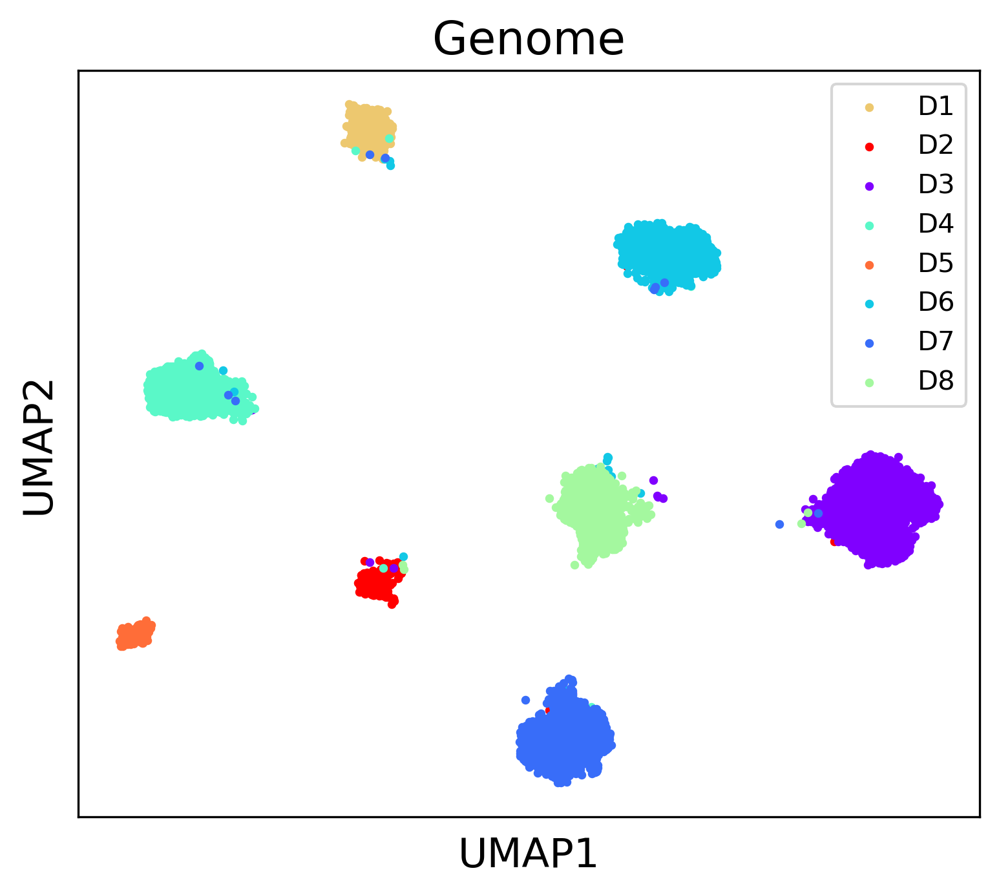

In [21]:
labels = ['D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8']

fig, axs = plt.subplots(1, 1, dpi = 300)
fig.set_size_inches(6, 5)

axs.set_title("Genome", fontsize = 17)
axs.set_xticks([])
axs.set_yticks([])
axs.set_xlabel("UMAP1", fontsize = 15)
axs.set_ylabel("UMAP2", fontsize = 15)

order = [5, 7, 0, 3, 6, 2, 1, 4]

for g in range(test1.cluster_no):
    
    selected = np.where(test1.assigned_label == order[g])[0]
    axs.scatter(test1.embedding_2d[selected, 0], test1.embedding_2d[selected, 1], s = 5, color = test1.colors[order[g]], label = labels[g])

axs.legend(loc ="upper right")

plt.show()

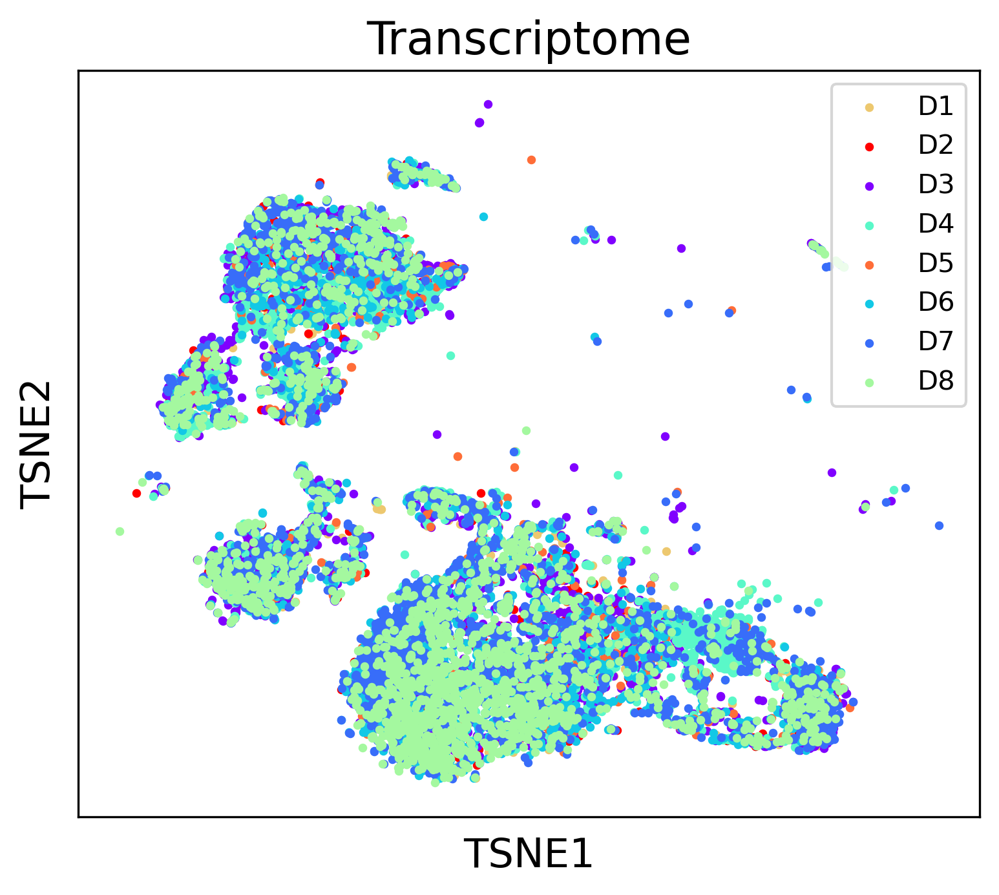

In [20]:
labels = ['D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8']

fig, axs = plt.subplots(1, 1, dpi = 300)
fig.set_size_inches(6, 5)

axs.set_title("Transcriptome", fontsize = 17)
axs.set_xticks([])
axs.set_yticks([])
axs.set_xlabel("TSNE1", fontsize = 15)
axs.set_ylabel("TSNE2", fontsize = 15)

order = [5, 7, 0, 3, 6, 2, 1, 4]

for g in range(test1.cluster_no):
    
    selected = np.where(test1.assigned_label == order[g])[0]
    axs.scatter(dffff["tsne1"].to_numpy()[selected], dffff["tsne2"].to_numpy()[selected], s = 5, color = test1.colors[order[g]], label = labels[g])

axs.legend(loc ="upper right")

plt.show()

In [22]:
import collections
counter = collections.Counter(dffff["cell"].tolist())
counter

Counter({'CD4 T cells': 5650,
         'CD14+ Monocytes': 3205,
         'Dendritic cells': 225,
         'NK cells': 1018,
         'CD8 T cells': 1382,
         'B cells': 1479,
         'Megakaryocytes': 112,
         'FCGR3A+ Monocytes': 868})

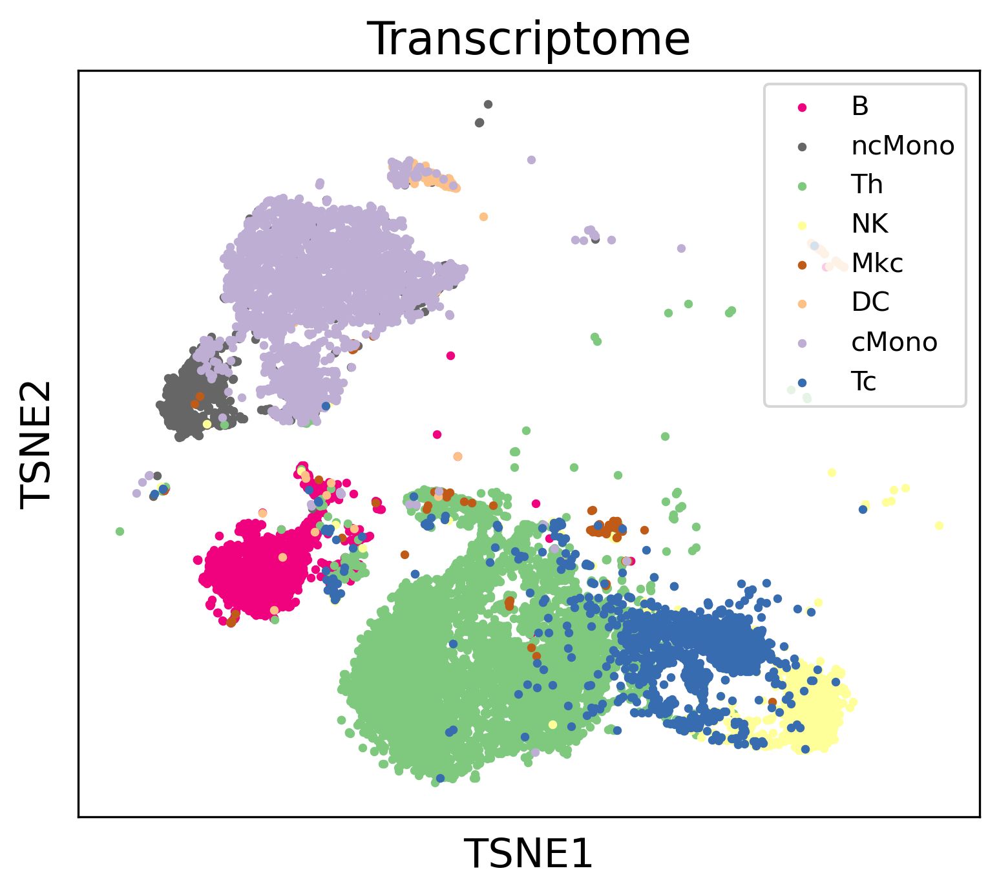

In [27]:
colors2 = cm.Accent(np.linspace(0, 1, 8))
labels = ['Th', 'cMono', 'DC', 'NK', 'Tc', 'B', 'Mkc', 'ncMono']

fig, axs = plt.subplots(1, 1, dpi = 300)
fig.set_size_inches(6, 5)

axs.set_title("Transcriptome", fontsize = 17)
axs.set_xticks([])
axs.set_yticks([])
axs.set_xlabel("TSNE1", fontsize = 15)
axs.set_ylabel("TSNE2", fontsize = 15)

for w in range(test1.cluster_no):
    
    g = [5, 7, 0, 3, 6, 2, 1, 4][w]
    
    selected = np.where(dffff["cell"].to_numpy() == list(counter.keys())[g])[0]
    
    axs.scatter(dffff["tsne1"].to_numpy()[selected], dffff["tsne2"].to_numpy()[selected], s = 5, color = colors2[g], label = labels[g])
    
axs.legend(loc ="upper right")

plt.show()

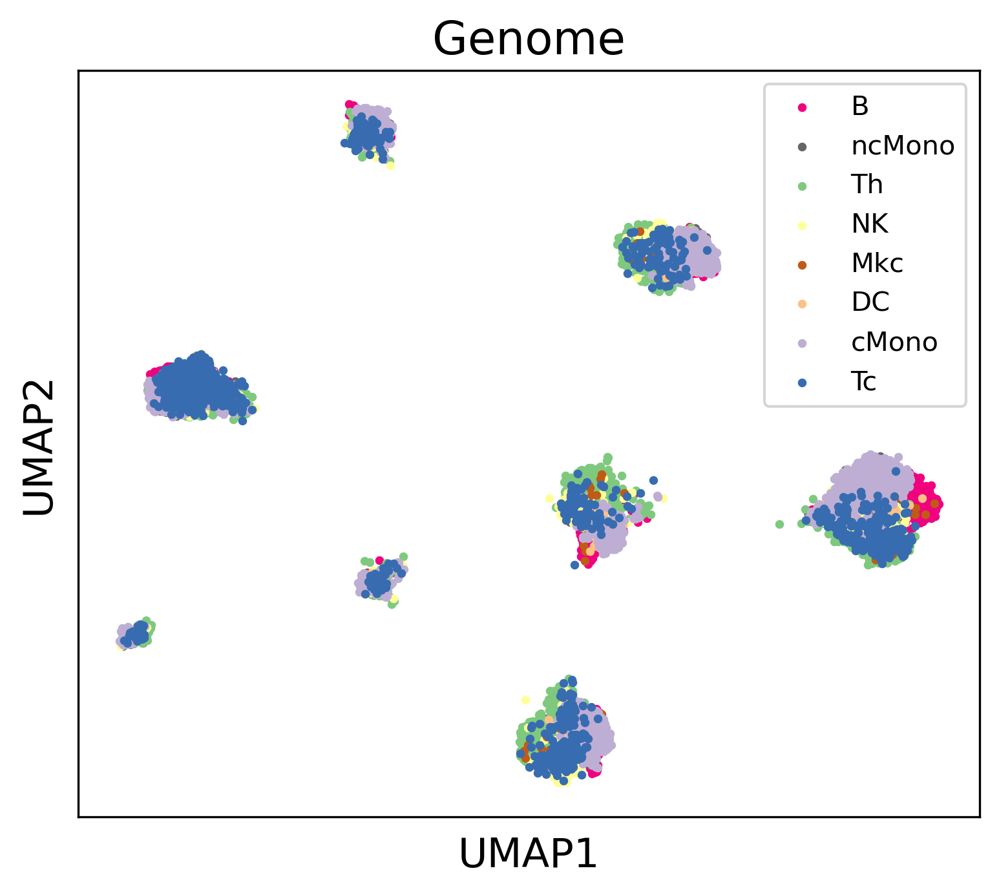

In [29]:
colors2 = cm.Accent(np.linspace(0, 1, 8))
labels = ['Th', 'cMono', 'DC', 'NK', 'Tc', 'B', 'Mkc', 'ncMono']

fig, axs = plt.subplots(1, 1, dpi = 300)
fig.set_size_inches(6, 5)

axs.set_title("Genome", fontsize = 17)
axs.set_xticks([])
axs.set_yticks([])
axs.set_xlabel("UMAP1", fontsize = 15)
axs.set_ylabel("UMAP2", fontsize = 15)

for w in range(test1.cluster_no):
    
    g = [5, 7, 0, 3, 6, 2, 1, 4][w]
    
    selected = np.where(dffff["cell"].to_numpy() == list(counter.keys())[g])[0]
    axs.scatter(test1.embedding_2d[selected, 0], test1.embedding_2d[selected, 1], s = 5, color = colors2[g], label = labels[g])

axs.legend(loc ="upper right")

plt.show()

In [30]:
np.savetxt("assigned_label.csv", test1.assigned_label, delimiter=",")
np.savetxt("embedding_2d.csv", test1.embedding_2d, delimiter=",")
np.savetxt("cell_filter.csv", test1.cell_filter, delimiter=",")
np.savetxt("SNP_filter.csv", test1.SNP_filter, delimiter=",")
np.savetxt("embedding_3d.csv", test1.embedding_3d, delimiter=",")
np.savetxt("distortion.csv", test1.distortions, delimiter=",")
np.savetxt("score.csv", test1.scores, delimiter=",")